<a href="https://colab.research.google.com/github/rzqmhb/PCVK_Ganjil_2023/blob/main/week07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

### Praktikum

In [3]:
def convolution2d(image, kernel, stride = 1, padding = 0):
  if(padding > 0):
    imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
    imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
  else:
    imagePadded = image

  output_x = int((image.shape[0] - kernel.shape[0]) // stride + 1)
  output_y = int((image.shape[1] - kernel.shape[1]) // stride + 1)
  output = np.zeros((output_x, output_y))

  for y in range(output.shape[0]):
    if y % stride == 0:
      for x in range(output.shape[0]):
        if x % stride == 0:
          output[x, y] = (kernel * imagePadded[x: x + kernel.shape[0], y: y + kernel.shape[1]]).sum()

  return output

In [32]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  output_height = (image.shape[0] - kernel.shape[0]) // stride + 1
  output_width = (image.shape[1] - kernel.shape[1]) // stride + 1

  output = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      output[y][x] = np.sum(image[y * stride:y * stride + kernel.shape[0], x * stride:x * stride + kernel.shape[1]] * kernel).astype(np.float32)

  return output

In [5]:
img = cv.imread('/content/drive/MyDrive/Kuliah_SMT_5/PCVK/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])

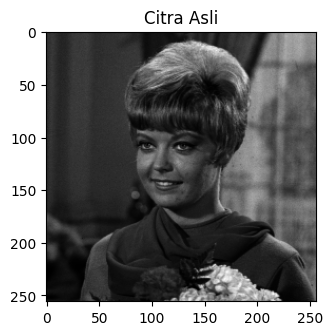

Hasil Filter Sharpen


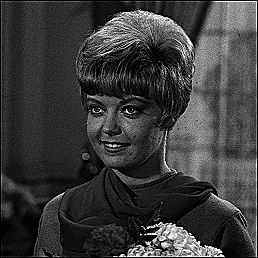

In [33]:
plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Sharpen')
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))

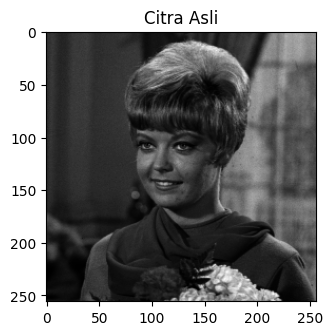

Hasil Filter Emboss


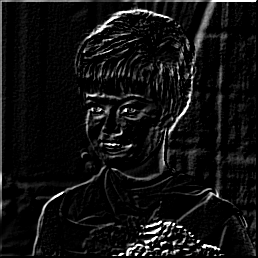

In [34]:
kernel_emboss = np.array([[-2,-1,0],
                          [-1,0,1],
                          [0,1,2]])

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Emboss')
cv2_imshow(convolution2d(img_gray, kernel_emboss, 1, 2))

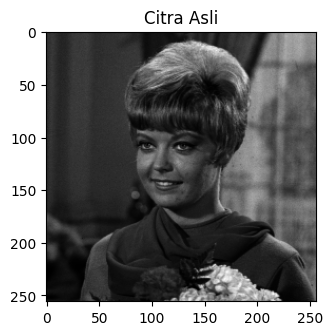

Hasil Filter Left Sobel Edge Detection


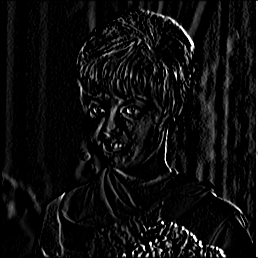

In [35]:
kernel_left_sobel = np.array([[1,0,-1],
                              [2,0,-2],
                              [1,0,-1]])

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Left Sobel Edge Detection')
cv2_imshow(convolution2d(img_gray, kernel_left_sobel, 1, 2))

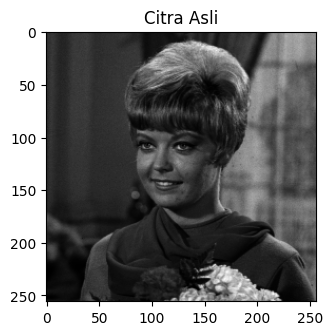

Hasil Filter Canny Edge Detection


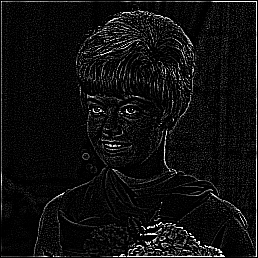

In [36]:
kernel_canny_edge = np.array([[-1,-1,-1],
                              [-1,8,-1],
                              [-1,-1,-1]])

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Canny Edge Detection')
cv2_imshow(convolution2d(img_gray, kernel_canny_edge, 1, 2))

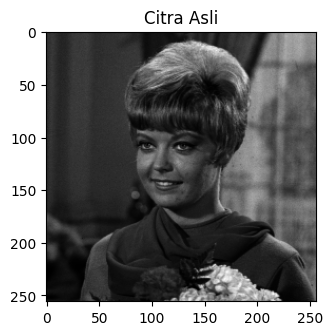

Hasil Filter Prewitt Edge Detection


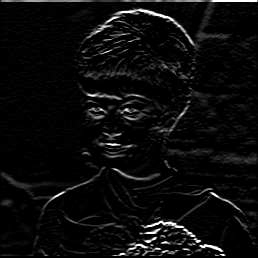

In [37]:
kernel_prewitt = np.array([[-1,-1,-1],
                            [0,0,0],
                            [1,1,1]])

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Prewitt Edge Detection')
cv2_imshow(convolution2d(img_gray, kernel_prewitt, 1, 2))

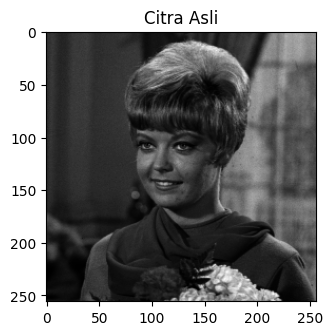

Hasil Filter Gaussian Blur


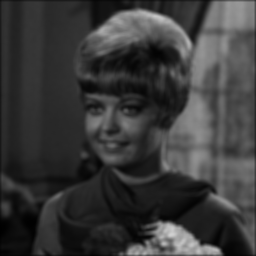

In [38]:
kernel_size = 5
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Gaussian Blur')
cv2_imshow(convolution2d(img_gray, kernel_gaussian_blur, 1, 2))

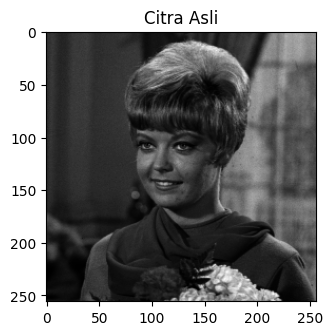

Hasil Filter Gaussian Blur


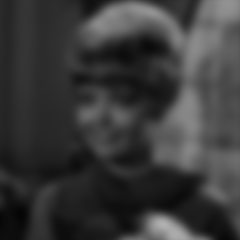

In [39]:
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

plt.figure(figsize=(3.5,3.5))
plt.imshow(img_gray, cmap='gray')
plt.title('Citra Asli')
plt.show()
print('Hasil Filter Gaussian Blur')
cv2_imshow(convolution2d(img_gray, kernel_gaussian_blur, 1, 2))

### Tugas

In [40]:
ktps = []
name = '/content/drive/MyDrive/Kuliah_SMT_5/PCVK/ktp/ktp'
for i in range(8):
  if (i==0):
    tmp = name + '.png'
    ktps.append(cv.imread(tmp))
    continue
  tmp = name + str(i) + '.png'
  ktps.append(cv.imread(tmp))

for ktp in ktps:
  ktp = cv.cvtColor(ktp, cv.COLOR_BGR2RGB)

ktps = [cv.resize(ktp, (640, 400)) for ktp in ktps]

#### KTP 1

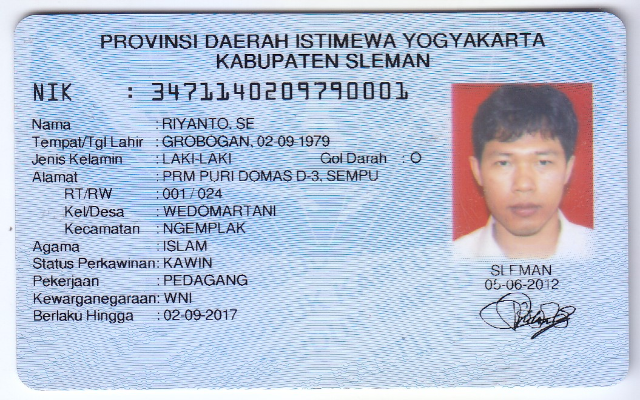

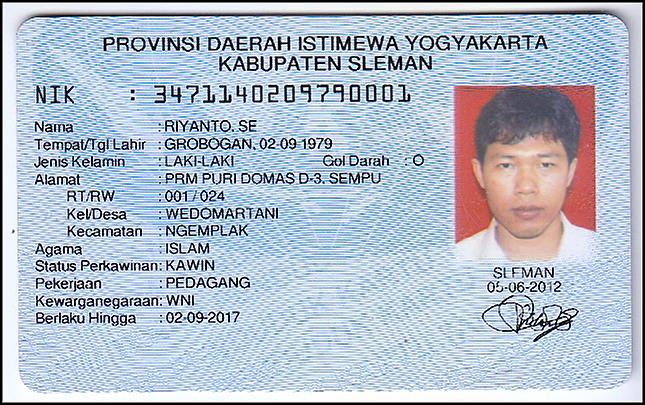

In [41]:
img = ktps[0]
kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

r = convolution2d(img[:,:,0], kernel_gaussian_blur, 1, 2)
g = convolution2d(img[:,:,1], kernel_gaussian_blur, 1, 2)
b = convolution2d(img[:,:,2], kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)

#### KTP 2

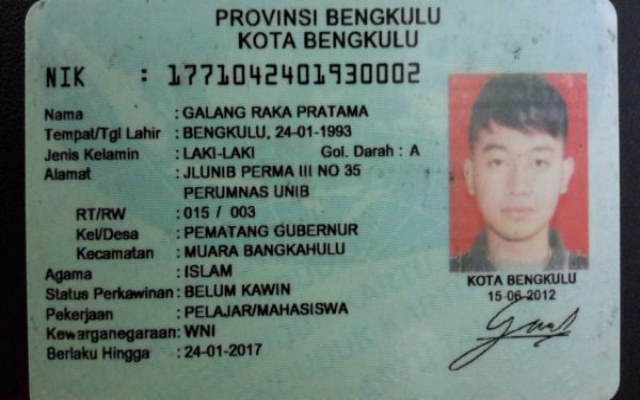

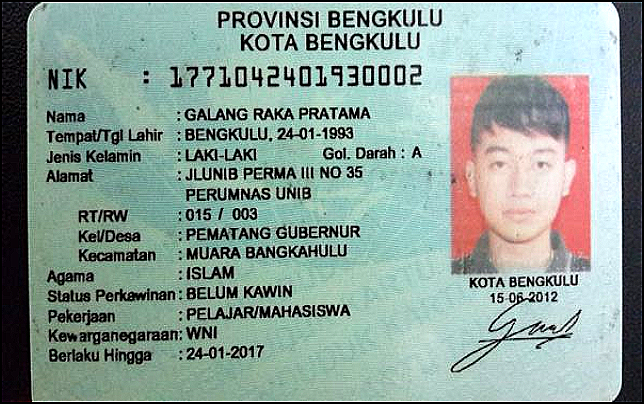

In [42]:
img = ktps[1]
lighten_kernel = np.array([[0, 0, 0],
                          [0, 1.29, 0],
                          [0, 0, 0]])

r = convolution2d(img[:,:,0], kernel_sharpen, 1, 2)
g = convolution2d(img[:,:,1], kernel_sharpen, 1, 2)
b = convolution2d(img[:,:,2], kernel_sharpen, 1, 2)
r = convolution2d(r, lighten_kernel, 1, 2)
g = convolution2d(g, lighten_kernel, 1, 2)
b = convolution2d(b, lighten_kernel, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)

#### KTP 3

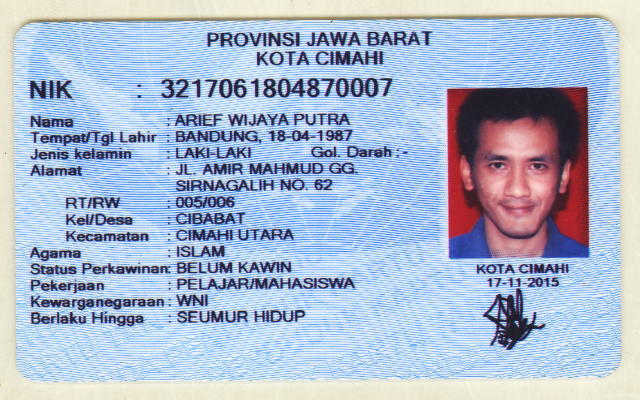

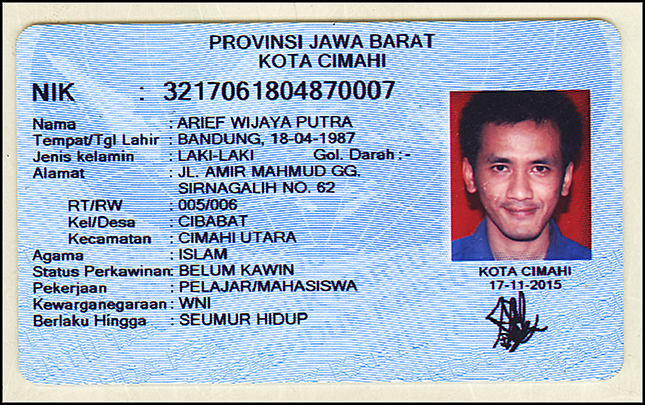

In [43]:
img = ktps[2]
kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

r = convolution2d(img[:,:,0], kernel_gaussian_blur, 1, 2)
g = convolution2d(img[:,:,1], kernel_gaussian_blur, 1, 2)
b = convolution2d(img[:,:,2], kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)

#### KTP 4

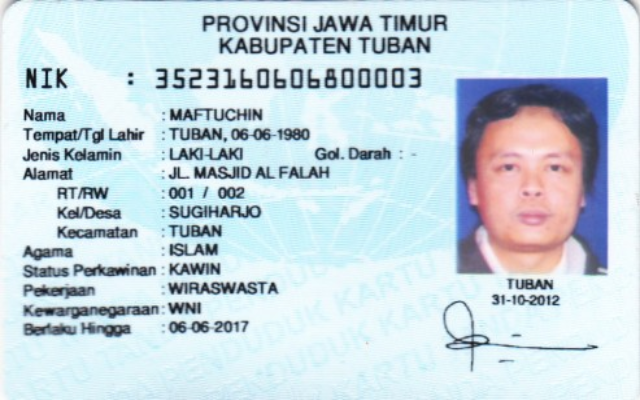

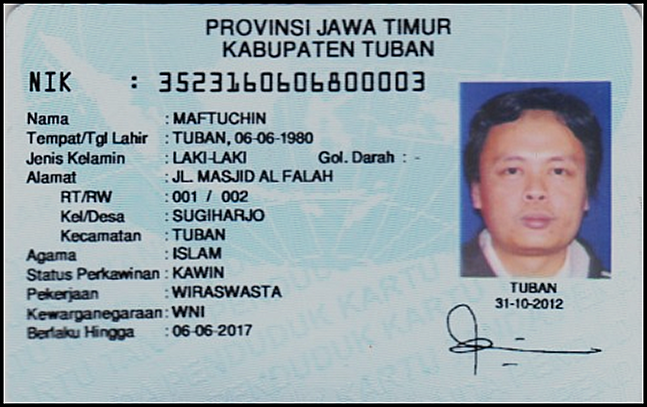

In [44]:
img = ktps[3]

kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

darken_kernel = np.array([[0, 0, 0],
                          [0, 0.8, 0],
                          [0, 0, 0]])

r = convolution2d(img[:,:,0], darken_kernel, 1, 2)
g = convolution2d(img[:,:,1], darken_kernel, 1, 2)
b = convolution2d(img[:,:,2], darken_kernel, 1, 2)
r = convolution2d(r, kernel_gaussian_blur, 1, 2)
g = convolution2d(g, kernel_gaussian_blur, 1, 2)
b = convolution2d(b, kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)

#### KTP 5

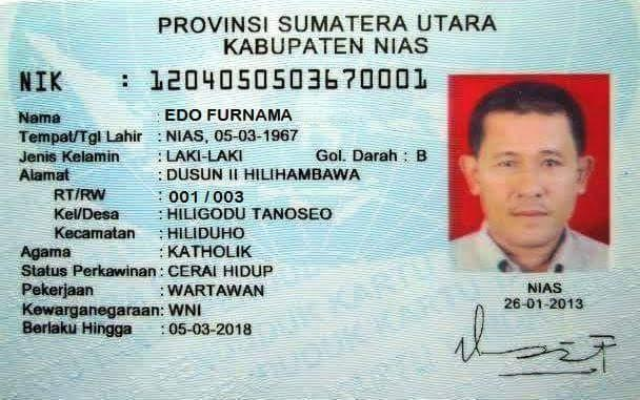

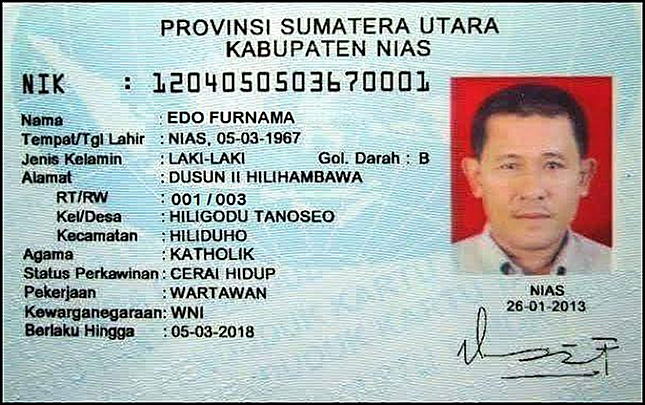

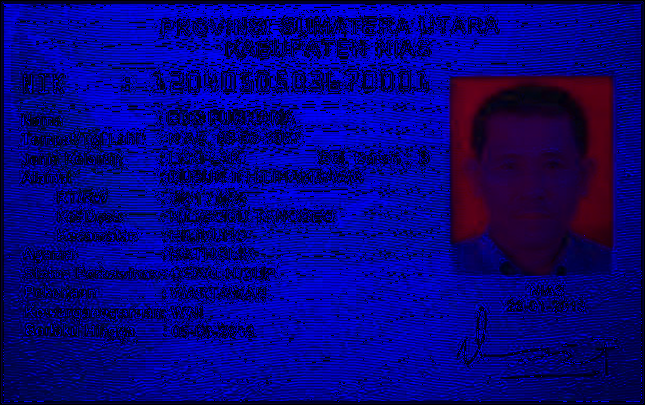

In [45]:
img = ktps[5]
kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

r = convolution2d(img[:,:,0], kernel_gaussian_blur, 1, 2)
g = convolution2d(img[:,:,1], kernel_gaussian_blur, 1, 2)
b = convolution2d(img[:,:,2], kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)
ktp = cv.merge((r,g,b))

ktp_eq = cv.cvtColor(ktp, cv.COLOR_RGB2YCrCb)
y, cr, cb = cv.split(ktp_eq)
y = y.astype(np.uint8)
y = cv.equalizeHist(y)
y = y.astype(np.float64)
cr = cr.astype(np.float64)
cb = cb.astype(np.float64)
ktp_eq = cv.merge((y,cr,cb))

cv2_imshow(img)
cv2_imshow(ktp)
cv2_imshow(ktp_eq) # Equalization Hist tidak menghasilkan citra yang lebih baik, jadi tidak digunakan

#### KTP 6

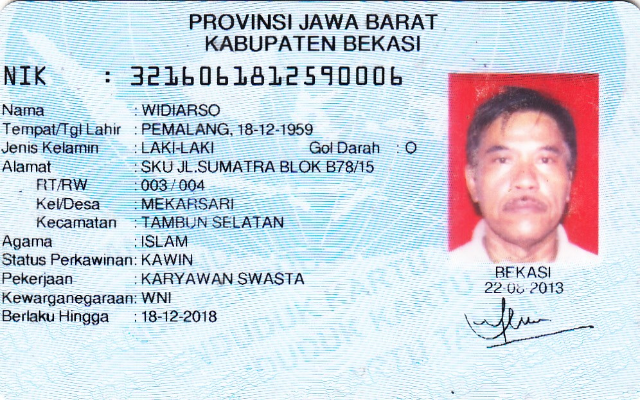

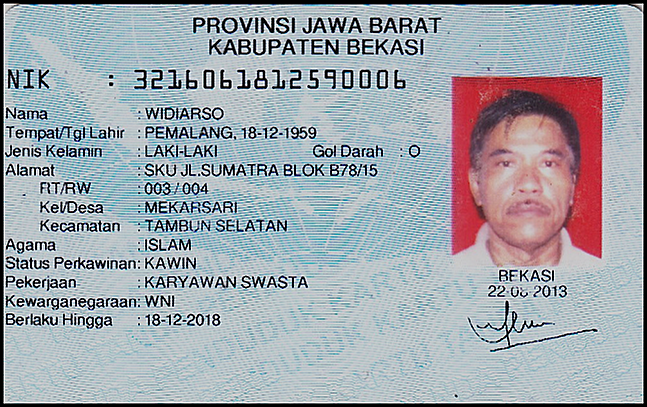

In [46]:
img = ktps[6]

kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

darken_kernel = np.array([[0, 0, 0],
                          [0, 0.8, 0],
                          [0, 0, 0]])

r = convolution2d(img[:,:,0], darken_kernel, 1, 2)
g = convolution2d(img[:,:,1], darken_kernel, 1, 2)
b = convolution2d(img[:,:,2], darken_kernel, 1, 2)
r = convolution2d(r, kernel_gaussian_blur, 1, 2)
g = convolution2d(g, kernel_gaussian_blur, 1, 2)
b = convolution2d(b, kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)

#### KTP 7

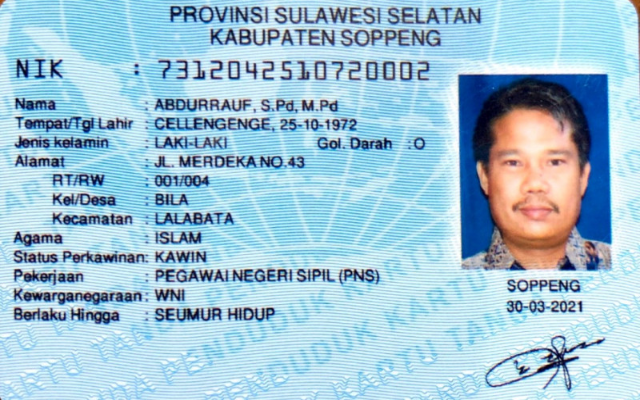

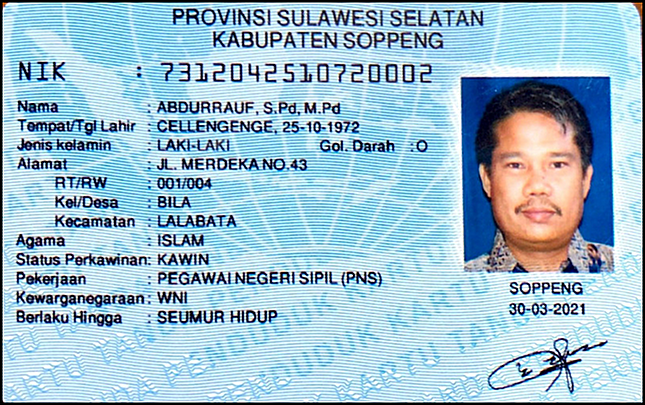

In [47]:
img = ktps[7]
kernel_size = 2
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
kernel_gaussian_blur = gaussian_kernel @ gaussian_kernel.transpose()

r = convolution2d(img[:,:,0], kernel_gaussian_blur, 1, 2)
g = convolution2d(img[:,:,1], kernel_gaussian_blur, 1, 2)
b = convolution2d(img[:,:,2], kernel_gaussian_blur, 1, 2)
r = convolution2d(r, kernel_sharpen, 1, 2)
g = convolution2d(g, kernel_sharpen, 1, 2)
b = convolution2d(b, kernel_sharpen, 1, 2)

ktp = cv.merge((r,g,b))
cv2_imshow(img)
cv2_imshow(ktp)